# Extracting Features and Detecting Actions in Pose Datasets
> JAX Short Course on Application of Machine Learning for Automated Quantification of Behavior 
> 
> October 13, 2022
>
> Ann Kennedy

⭐ In this notebook we will learn how to visualize and analyze pose tracking and behavior annotation data, like you might get from DLC/SLEAP and from manual (Boris, VGG, Bento) or supervised (MARS, SimBA) behavior annotation.

🐁 We'll be using data from [The Caltech Mouse Social Interactions (CalMS21)](https://data.caltech.edu/records/s0vdx-0k302) dataset, which was used in Task 1 of the 2021 [Multi-Agent Behavior Challenge](https://www.aicrowd.com/challenges/multi-agent-behavior-representation-modeling-measurement-and-applications):

![](https://images.aicrowd.com/uploads/ckeditor/pictures/336/content_task1_structure.png)

The specific file we'll be working with is `calms21_task1_train.json` which you'll find within `task1_classical_classification.zip`. (We're downloading it programmatically, so no need to find that file now.)

## What to do with these cells:
🏃 = run this cell (for loading data, defining helper functions, etc)

🔎 = run this cell and check at its output

🧪 = experiment with values in this cell

❓ = things to think about

# Part I. Setup

## Importing python packages and downloading the data.
I've posted a copy of the dataset to google drive, so we will install and use the python module `gdown` to download it.

In [ ]:
#@title 🏃 Package import
# install a library to download files from google drive
!pip install gdown

# import the basics
import os
import numpy as np
import math
import json
import copy

# import some plotting functions from matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rc
import matplotlib.patches as mpatches

# import some signal processing tool from scipy
from scipy.ndimage import median_filter, gaussian_filter, minimum_filter, maximum_filter

# this line is just a fix to get our animations to play in colab:
rc('animation', html='jshtml')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#@title 🏃 Data download

!gdown --folder https://drive.google.com/drive/folders/17RwHfmj-tyx2riWpTzXnIGvMY-5tl1ai

Retrieving folder list
Processing file 1XEKQjS9AZzfOkQm1K_BNizzr_gl47Zd8 calms21_short.json
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1XEKQjS9AZzfOkQm1K_BNizzr_gl47Zd8
To: /content/short/calms21_short.json
100% 91.2M/91.2M [00:00<00:00, 145MB/s]
Download completed


## ❖ Load the dataset

OK, let's load our tracking data. This is a json file containing behavior annotations, keypoints, and keypoint confidences ("scores") from the training set of CalMS21. [More resources on CalMS21 are found here](https://sites.google.com/view/computational-behavior/our-datasets/calms21-dataset).

For today's exercises, we're just going to use the CalMS21 training set, which includes tracking data from 70 videos of socially interacting mice engaged in a standard resident-intruder assay.

In [ ]:
#@title 🏃 Loading the CalMS21 task 1 train dataset

with open('/content/2022_JAX_day4_heuristics/calms21_task1_train.json', 'r') as fp:
  training_data = json.load(fp)

The layout of the `calms21` .json files are as follows:

```json
{
    "annotator-id_0": {
        "task1/train/mouse001_task1_annotator1": {
            "keypoints": [...],
            "scores": [...],
            "annotations": [...],
            "metadata": {
                "vocab": {
                    "attack": 0,
                    "investigation": 1,
                    "mount": 2,
                    "other": 3
                }
            }
        },
        "task1/train/mouse002_task1_annotator1": {
            "keypoints": [...],
            "scores": [...],
            (etc)...       
        },
        ...
    }
}
```

In [ ]:
#@title 🔎 Look at the contents of one trial

from itertools import islice
trial = training_data['annotator-id_0']['task1/train/mouse001_task1_annotator1']

# list the fields associated with the trial
print('fields associated with a trial:',trial.keys(),'\n')
print('anotations: dimensions', np.shape(np.array(trial['annotations'])))
print(np.array(trial['annotations']),'\n')
print('keypoints: dimensions', np.shape(np.array(trial['keypoints'])))
print(np.array(trial['keypoints']))

fields associated with a trial: dict_keys(['annotations', 'keypoints', 'metadata', 'scores']) 

anotations: dimensions (21364,)
[3 1 1 ... 2 2 2] 

keypoints: dimensions (21364, 2, 2, 7)
[[[[831.6592041  805.6592041  775.6592041  ... 711.6592041
    711.6592041  643.6592041 ]
   [202.914433   250.914433   189.914433   ... 278.914433
    192.914433   220.914433  ]]

  [[856.91592407 843.91592407 897.91592407 ... 796.91592407
    840.91592407 766.91592407]
   [253.21690217 195.21690217 193.21690217 ... 152.21690217
    102.21690217  97.21690217]]]


 [[[833.05043945 809.05043945 778.05043945 ... 723.05043945
    717.05043945 644.05043945]
   [201.8950628  251.8950628  193.8950628  ... 287.8950628
    192.8950628  227.8950628 ]]

  [[860.90701904 847.90701904 899.90701904 ... 799.90701904
    846.90701904 766.90701904]
   [259.53997728 204.53997728 201.53997728 ... 153.53997728
    105.53997728  98.53997728]]]


 [[[838.71897583 816.71897583 776.71897583 ... 730.71897583
    713.71897583 

In [ ]:
#@title 🧪 Print some information about our dataset

ANNOTATOR_NUM = 0 # (we only have one annotator in this dataset)
SEQUENCE_NUM = 10

####################################

anno_name = list(training_data.keys())
annotator_data = training_data[anno_name[ANNOTATOR_NUM]]
seqs = list(annotator_data.keys())

sample_seq = annotator_data[seqs[SEQUENCE_NUM]]
part_names =  ['nose', 'ear 1', 'ear 2', 'neck', 'hip 1', 'hip 2', 'tail base']  # this metadata isn't included in the json, sorry :[
vocab = sample_seq['metadata']['vocab']

print("First level (list of annotators): ", training_data.keys(), "\n")

print("Second level (list of sequences) for ",anno_name[ANNOTATOR_NUM],": ", list(annotator_data.keys())[:3], "... etc")

print("  - Number of sequences for this annotator: ", len(annotator_data),"\n")

print("Third level (sequence data) for sequence",seqs[SEQUENCE_NUM],": ", sample_seq.keys())

print("  - Sequence metadata content: ", sample_seq['metadata'].keys())
print("      > Sequence vocab: ", vocab,"\n")

print("  - Sequence annotation dims: ", np.shape(sample_seq['annotations']))
annots_appearing = list(set(sample_seq['annotations']))
print("      > Annotations found in sequence", SEQUENCE_NUM,': ', [j for j in list(vocab.keys()) for i in annots_appearing if vocab[j]==i],'\n')

print("  - Sequence keypoint dims:   ", np.shape(sample_seq['keypoints']))
print("      > dimensions are (video frames) x (mouse ID) x (x,y) x (body part)")
print("      > parts are ordered ",part_names,"\n")

print("  - Sequence scores dims: ", np.shape(sample_seq['scores']))
print("      > scores are our keypoint confidences, and range between 0 (worst) and 1 (best)")
print("      > dimensions are (video frames) x (mouse ID) x (body part), with parts ordered as above\n")

First level (list of annotators):  dict_keys(['annotator-id_0']) 

Second level (list of sequences) for  annotator-id_0 :  ['task1/train/mouse001_task1_annotator1', 'task1/train/mouse002_task1_annotator1', 'task1/train/mouse003_task1_annotator1'] ... etc
  - Number of sequences for this annotator:  70 

Third level (sequence data) for sequence task1/train/mouse011_task1_annotator1 :  dict_keys(['annotations', 'keypoints', 'metadata', 'scores'])
  - Sequence metadata content:  dict_keys(['annotator-id', 'vocab'])
      > Sequence vocab:  {'attack': 0, 'investigation': 1, 'mount': 2, 'other': 3} 

  - Sequence annotation dims:  (4260,)
      > Annotations found in sequence 10 :  ['investigation', 'mount', 'other'] 

  - Sequence keypoint dims:    (4260, 2, 2, 7)
      > dimensions are (video frames) x (mouse ID) x (x,y) x (body part)
      > parts are ordered  ['nose', 'ear 1', 'ear 2', 'neck', 'hip 1', 'hip 2', 'tail base'] 

  - Sequence scores dims:  (4260, 2, 7)
      > scores are ou

# Part II. Visualize your data as many ways as you can
Before we get too deep into analyzing animal behavior, we should do some quick investigation to make sure we understand how the data is formatted. For CalMS21, we are most likely interested in `annotations` and `keypoints`.

## ❖ Looking at the pose data
First, let's look at the tracker output we have for some of our sequences:

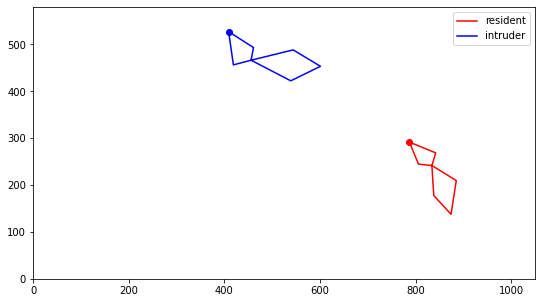

In [ ]:
#@title 🧪 Plot the poses of the two mice on one frame

SEQUENCE_NUM = 10
FRAME_NUM = 60

###################################

# pull our trial out of the dataset
video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_video = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]
keypoints = np.array(sample_video['keypoints'])

%matplotlib inline
plt.figure(figsize=(9,5))
order = [3, 1, 0, 2, 3, 4, 6, 5, 3]  # drawing a line through the CalMS21 keypoints in this order plots a figure-8 shape
for mouse,color,label in zip([0,1],['r','b'],['resident','intruder']):
  plt.plot(keypoints[FRAME_NUM,mouse,0,order], keypoints[FRAME_NUM,mouse,1,order],color,label=label)
  plt.plot(keypoints[FRAME_NUM,mouse,0,0], keypoints[FRAME_NUM,mouse,1,0], color + 'o')

plt.xlim((0,1050));
plt.ylim((0,580));
plt.legend();

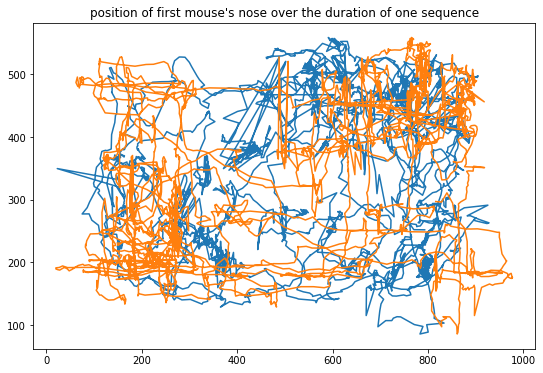

In [ ]:
#@title 🧪 Visualize one mouse's trajectory in space

SEQUENCE_NUM = 10  # which trial we're looking at
MOUSE_NUM = 0   # which mouse we're looking at (0 = resident, 1 = intruder)
PART_NUM = 0    # which body part we're looking at (0 = the nose)

###################################

# pull our trial out of the dataset
video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_video = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]
keypoints = np.array(sample_video['keypoints'])

%matplotlib inline
plt.figure(figsize=(9,6))
plt.plot(keypoints[:,0,0,PART_NUM],keypoints[:,MOUSE_NUM,1,PART_NUM])
plt.plot(keypoints[:,1,0,PART_NUM],keypoints[:,MOUSE_NUM,1,PART_NUM])
plt.title('position of first mouse\'s nose over the duration of one sequence');

## ❖ Looking at annotations

Now let's get a sense of what our annotations look like. Here are two helper functions: one for converting a vector of frame labels into bouts of behavior, and one for plotting a raster of behavior annotations for a given trial in our dataset.

For this demo we're just going to hardcode color assignments in the `get_color_defaults()` helper function. If you wanted to you could load these settings from a file (like Bento does.)

In [ ]:
#@title 🏃 Some helper functions for plotting annotations
def get_color_defaults(): # change this to add color preferences for whatever annotations are in your data
    colors = {'attack':'firebrick','mount':'green','investigation':'goldenrod','other':'gainsboro'}
    return colors


def convert_to_bouts(annots, vocab):
  # converts a vector of integers into a dictionary of behavior bouts. keys of the dictionary
  # correspond to names of behaviors; for each behavior we keep a list of the start and stop frames
  # of each bout.

  def return_true_values(arr): # returns indices of true values in an array
    return np.array([i for i in range(len(arr)) if arr[i]])
  
  bouts = dict.fromkeys(vocab.keys(),[])
  for k in vocab.keys():
    if k=='other':
      continue
    bout_starts_bool = [annots[0]==vocab[k]] + [a==vocab[k] and b!=vocab[k] for a,b in zip(annots[1:],annots[:-1])] # true for the first frame in a bout only
    bout_ends_bool = [a!=vocab[k] and b==vocab[k] for a,b in zip(annots[1:],annots[:-1])] + [annots[-1]==vocab[k]]  # true for the last frame in a bout only
    bout_starts = return_true_values(bout_starts_bool)
    bout_ends = return_true_values(bout_ends_bool)
    bouts[k] = np.stack((bout_starts, bout_ends),axis=1)
  return bouts


def raster_plotter(annotations, vocab, tmax, ax, fps=30., stagger=False, colors={}):
  if not len(colors.keys()):  # load our color settings if we didn't override them
    colors = get_color_defaults()

  sizes = np.zeros((len(colors.keys())))  #  a running count of the fraction of frames in each category
  cmap = [] # a running list of colors in the order they should be used in the piechart

  for c,beh in enumerate(colors.keys()): # loop over behaviors
    if beh=='other': # don't count bouts of "other"
      continue

    for bout in annotations[beh]: # loop over bouts of a given behavior and plot them
      if stagger: # sometimes this is easier for visualizing annotations of many behaviors
        ax.add_patch(mpatches.Rectangle([bout[0]/fps, c/(len(colors.keys())-1)], (bout[1]-bout[0]+1)/fps, 1/(len(colors.keys())-1), facecolor=colors[beh], edgecolor=None))
      else:
        ax.add_patch(mpatches.Rectangle([bout[0]/fps,0], (bout[1]-bout[0]+1)/fps, 1, facecolor=colors[beh], edgecolor=None))
      sizes[c] += (bout[1]-bout[0]+1)/tmax

    ax.text(tmax*1.05/fps, (c+0.5)/(len(colors.keys())-1), beh, color=colors[beh],fontweight='bold',fontsize=12)
    cmap.append(colors[beh])

  cmap.append(colors['other'])

  ax.set_xlim((0, tmax*1.25/fps))
  ax.set_xlabel('time (seconds)')
  ax.set_yticks([])
  return sizes, cmap, colors


def plot_behavior_raster(annotations, vocab, tmax, fps=30., stagger=False, colors={}):
  # creates a behavior raster given annotation bouts produced by convert_to_bouts

  fig,ax = plt.subplots(nrows=1,ncols=2, figsize=[15,4], gridspec_kw={'width_ratios': [3, 1]})

  sizes,cmap,colors = raster_plotter(annotations, vocab, tmax, ax[0], fps=fps, stagger=stagger, colors=colors)

  sizes[-1] = 1 - sum(sizes[:-1])
  ax[1].pie(sizes, explode=[0.1]*(len(cmap)), labels=list(colors.keys()), autopct='%1.1f%%', startangle=90, colors=cmap)
  plt.show()

Let's use these functions to see what behaviors are happening in a given trial. You can change the index in `annotator_data[seqs[0]]` to see annotations from a different trial in the dataset.

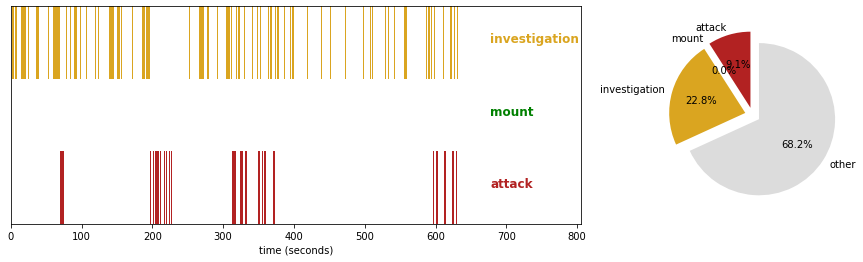

In [ ]:
#@title 🧪 Plot a raster of behavior annotations

SEQUENCE_NUM = 1 # change this to look at different trials (there are 70 total)
STAGGER = True

#####################################

anno_name = list(training_data.keys())          # list the annotators in the dataset
annotator_data = training_data[anno_name[0]]    # select which annotator we're looking at (there's only one in this dataset)
seqs = list(annotator_data.keys())
sample_seq = annotator_data[seqs[SEQUENCE_NUM]] # select the sequence we want to plot (the first one in our list of sequences)
vocab = sample_seq['metadata']['vocab']         # determine the list of behaviors that were annotated
tmax = len(sample_seq['annotations'])           # determine the number of frames in a file

# %matplotlib inline
bouts = convert_to_bouts(sample_seq['annotations'], vocab)
plot_behavior_raster(bouts, vocab, tmax, fps=30.0, stagger=STAGGER)

collected data from  507738  frames


Text(0, 0.5, 'time observed (minutes)')

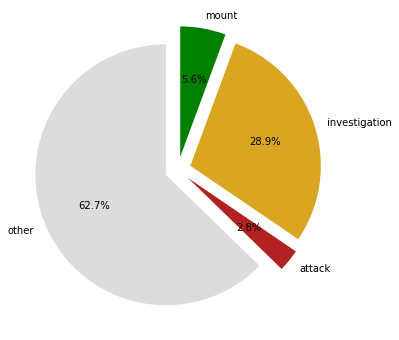

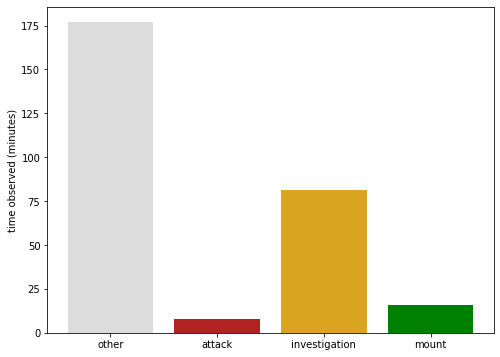

In [ ]:
#@title 🔎 Find number of minutes of each behavior observed in the full dataset

fps = 30.0

# first, let's concatenate together all annotations in our dataset, and
# keep a running record of all behaviors annotated. In this dataset, all trials
# were annotated for the same actions- but that's not always the case.
all_anno=[]
all_vocab={}
for _,trial in training_data['annotator-id_0'].items():
  vocab = trial['metadata']['vocab']
  annotations = [s for a in trial['annotations'] for s in vocab.keys() if vocab[s]==a]
  all_anno += annotations
  all_vocab.update(vocab)
print('collected data from ', len(all_anno), ' frames')

colors = get_color_defaults() # a helper function so our annotation coloring is consistent

# next, let's count how often each behavior occurs, and convert that count to minutes.
cmap = []
counts = []
label_list = []
for behavior in set(all_anno):  # set gets the set of unique values
  counts.append(all_anno.count(behavior)/fps/60) # count how many times each behavior appears, convert to minutes
  cmap.append(colors[behavior])
  label_list.append(behavior)

###################################
# plotting code

# plot behavior occurrences as a pie chart
plt.figure(figsize=(6,6))
plt.pie(counts, explode=[0.1]*len(cmap), labels=label_list, autopct='%1.1f%%', startangle=90, colors=cmap);

# plot behavior occurrences as a bar graph
plt.figure(figsize=(8,6))
plt.bar(range(len(counts)), counts, color=cmap);
plt.xticks(range(len(counts)),label_list)
plt.ylabel('time observed (minutes)')

In [ ]:
#@title 🔎 Determine how many sequences contain each behavior

all_anno = []
all_vocab = {}
for _,trial in training_data['annotator-id_0'].items():
  vocab = trial['metadata']['vocab']
  annotations = [s for a in trial['annotations'] for s in vocab.keys() if vocab[s]==a]
  all_anno.append(annotations) # this time we're making a list of lists, rather than concatenating!
  all_vocab.update(vocab)

for behavior in all_vocab.keys():
  num_hits = sum([behavior in a for a in all_anno])
  print(behavior, ':', num_hits, 'out of', len(all_anno), 'sequences')

attack : 18 out of 70 sequences
investigation : 69 out of 70 sequences
mount : 41 out of 70 sequences
other : 70 out of 70 sequences


> Most behaviors occur over multiple frames; we call a contiguous sequence of frames that were all annotated for a given behavior a **bout** of that behavior. It can be useful to analyze behavior in terms of observed bouts rather than total time.

attack : 194 bouts observed
investigation : 1811 bouts observed
mount : 282 bouts observed


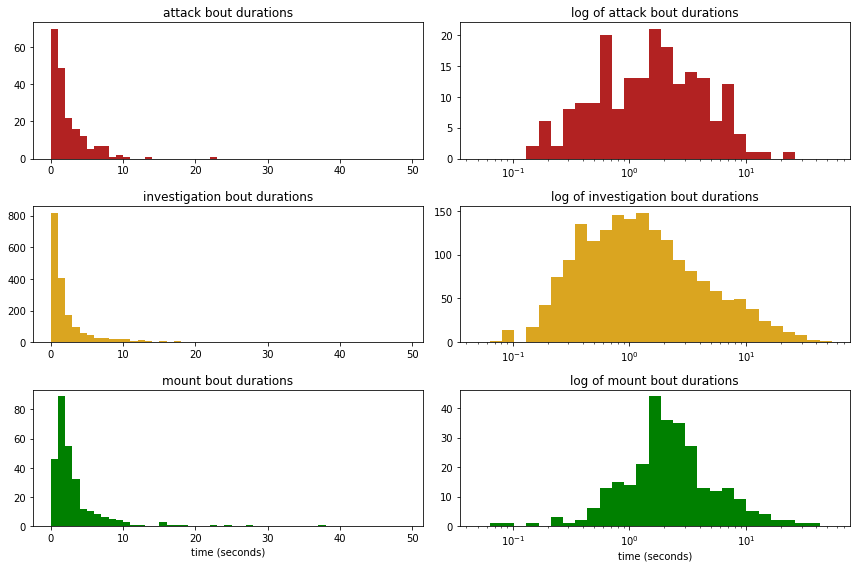

In [ ]:
#@title 🔎 Compute some statistics on behavior bouts

all_bouts = {}
for _,trial in training_data['annotator-id_0'].items():
  vocab = trial['metadata']['vocab']
  annotations = convert_to_bouts(trial['annotations'], vocab)  # converts annotations to bouts via a helper function
  for beh in annotations.keys():
    if beh=='other': # don't count bouts of "other"
      continue
    # store the extracted bouts from this trial into a running record of all bouts
    if beh not in all_bouts.keys() or not len(all_bouts[beh]):
      all_bouts[beh] = annotations[beh]
    else:
      all_bouts[beh] = np.concatenate((all_bouts[beh],annotations[beh]), axis=0)

# print out the number of bouts of each behavior in the dataset
for behavior in all_bouts.keys():
  num_bouts = len(all_bouts[behavior])
  print(behavior, ':', num_bouts, 'bouts observed')

###################################
# plotting histograms of bout durations

fig,ax = plt.subplots(len(all_bouts.keys()),2,figsize=(12,8))
bout_durations=[]
behavior_names=[]
for i,behavior in enumerate(all_bouts.keys()):
  bout_durations = (all_bouts[behavior][:,1] - all_bouts[behavior][:,0] + 1)/fps
  
  ax[i,0].hist(bout_durations,range(50),color=colors[behavior])
  ax[i,0].set_title(behavior+' bout durations')  

  ax[i,1].hist(bout_durations,np.exp(np.linspace(-3,4,30)),color=colors[behavior])
  ax[i,1].set_title('log of ' + behavior + ' bout durations')
  ax[i,1].set_xscale('log')

ax[len(all_bouts.keys())-1,0].set_xlabel('time (seconds)')
ax[len(all_bouts.keys())-1,1].set_xlabel('time (seconds)')

fig.tight_layout()

## ❖ Making an animation of mouse movements
Next, here is a function that you can call to generate an animation of the interacting mice over a given array of frames. (Click "Show Code" if you're curious, but make sure you run it.)

In [ ]:
#@title 🏃 Animation helper functions

def plot_mice(fig, trial, frame_range):

  # unpack the data from this trial
  keypoints = np.array(trial['keypoints'])
  vocab = trial['metadata']['vocab']

  # trial['annotations'] stores annotations as integers, but we want the actual
  # behavior names. so this is some pythonic chicanery to convert the list of
  # integers to a list of strings, all in one line:
  annotations = [s for a in trial['annotations'] for s in vocab.keys() if vocab[s]==a]

  # you could do the same thing with a more traditional script as follows:
  # annotations = []
  # for a in trial['annotations']:
  #   for s in vocab.keys():
  #     if vocab[s]==a:
  #       annotations.append(s)

  order = [3,1,0,2,3,4,6,5,3]  # this is CalMS21-specific: we draw a line from neck-ear-nose-ear-neck-hip-tail-hip-neck, giving us pose as a figure 8.
  colors = get_color_defaults()
  colors['other'] = 'black' # add a text color for "other" (no annotated behavior)

  lines={'m0':{},'m1':{}}
  for mouse,color,label in zip(['m0','m1'],['r','b'],['resident','intruder']): # zip is a cute python function to loop over groups of lists
    lines[mouse]['body'] = plt.plot([], color, label=label) # an empty line object we will use to plot the body
    lines[mouse]['nose'] = plt.plot([], color + 'o')        # an empty line object we will use to plot a point on the nose
    lines[mouse]['history'] = plt.plot([], color + '--')    # an empty line object we will use to plot a dotted line showing where the nose has been
    behavior_string = plt.text(10, 10, '', fontsize=16, fontweight='bold')

  def animate(frame_num): # this updates the figure to show the pose data and label from the current frame
    history_length = 10  # number of frames into the past to show
    inds = range(max(frame_num - history_length, 0), frame_num+1)

    for mouse_name, mouse_idx in zip(['m0','m1'],[0,1]):
      lines[mouse_name]['body'][0].set_data((keypoints[frame_num, mouse_idx, 0, order], keypoints[frame_num, mouse_idx, 1, order]))  # update the plot of the body
      lines[mouse_name]['nose'][0].set_data((keypoints[frame_num, mouse_idx, 0, 0], keypoints[frame_num, mouse_idx, 1, 0]))  # update the plot of the nose
      lines[mouse_name]['history'][0].set_data((keypoints[inds, mouse_idx, 0, 0], keypoints[inds, mouse_idx, 1, 0]))  # update the plot of the animal's history

    behavior_string.set_text(annotations[frame_num])
    behavior_string.set_color(colors[annotations[frame_num]])

    plot_objects = [lines[m][o] for m in lines.keys() for o in lines[list(lines.keys())[0]].keys()]
    plot_objects.append(behavior_string)

    return plot_objects

  # FuncAnimation is a matplotlib function that will call a function over and
  # over again, each time passing it one of the numbers in frame_range, and
  # will plot the output in fig.
  anim = FuncAnimation(fig, animate, frames=frame_range);
  return anim

After running the code above, we can call it for a given trial, to plot mouse trajectories over some range of frames in the trial. 

> Note: start/stop/step are in frames; this data was recorded at 30 frames per second.

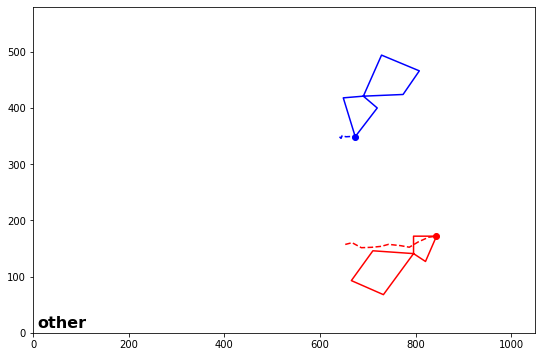

In [ ]:
#@title 🧪 Generate an animation of mouse interactions

MOUSE_NUM = 1
# plot frames 1000 to 1200 of our trial, sampling every 2nd frame:
ANIMATION_START = 1000
ANIMATION_STOP = 1200
ANIMATION_STEP = 2

animation_range = range(ANIMATION_START,ANIMATION_STOP,ANIMATION_STEP)

###########################################
# plotting code

seq_list = list(training_data['annotator-id_0'].keys())           # get the list of all trials ("sequences")
sample_seq = training_data['annotator-id_0'][seq_list[MOUSE_NUM]] # pick one trial for plotting

# %matplotlib notebook  # if nothing plots when you run this cell, try un-commenting (deleting the "# " at the start of) this line
fig = plt.figure(figsize=[9,6]) # create a figure
plt.xlim(0,1050)  # set the x and y axes to match the size of our frame in pixels (this is CalMS21-specific)
plt.ylim(0,580)
anim = plot_mice(fig, sample_seq, frame_range=animation_range); 
anim

## ❖ Making an animation script for trajectory comparison

The above plotting code will show us one example trajectory. What if we want to see the effect of some preprocessing step on our trajectory (like smoothing)? Let's write a plotting function that will let use display multiple trajectories at once:

In [ ]:
#@title 🏃 Animation helper functions: multi-trajectory version

# we've pulled out "animate" into its own function, and set up a wrapper that calls it
# multiple times, once for each trial in a list. our wrapper requires that we have
# initialized plotting objects for each trial.

def animate_wrapper(frame_num, trial_list, line_groups, behavior_strings, arena=[]):

  all_plot_objects = []
  for trial, lines, behavior_string in zip(trial_list, line_groups, behavior_strings):

    keypoints = np.array(trial['keypoints'])
    vocab = trial['metadata']['vocab']
    annotations = [s for a in trial['annotations'] for s in vocab.keys() if vocab[s]==a]

    # we've unpacked all the signals we need from a single trial- now let's call animate on them!
    plot_objects = animate_trial(frame_num, keypoints, annotations, lines, behavior_string, arena)
    all_plot_objects.append(plot_objects)
  
  return all_plot_objects


def animate_trial(frame_num, keypoints, annotations, lines, behavior_string, arena=[]):

  order = [3,1,0,2,3,4,6,5,3]
  history_length = 10
  inds = range(max(frame_num - history_length, 0), frame_num+1)
  colors = get_color_defaults()
  colors['other']='black'

  for mouse_idx, mouse_name in enumerate(['m0','m1']):
    lines[mouse_name]['body'][0].set_data((keypoints[frame_num,mouse_idx,0,order], keypoints[frame_num,mouse_idx,1,order]))
    lines[mouse_name]['nose'][0].set_data((keypoints[frame_num,mouse_idx,0,0], keypoints[frame_num,mouse_idx,1,0]))
    lines[mouse_name]['history'][0].set_data((keypoints[inds,mouse_idx,0,0], keypoints[inds,mouse_idx,1,0]))
  if len(arena):
    lines['arena']['walls'][0].set_data((arena[frame_num,:,0], arena[frame_num,:,1]))

  behavior_string.set_text(annotations[frame_num])
  behavior_string.set_color(colors[annotations[frame_num]])
  plot_objects = [lines[m][o] for m in lines.keys() for o in lines[m].keys()]
  plot_objects.append(behavior_string)

  return plot_objects
  

# and here's our revised version of plot_mice. Rather than passing it a single trial,
# we pass it a list of trials we want to plot frames from.
def plot_mice_multitrial(fig, trial_list, frame_range, arena=[]):

  line_groups=[]
  behavior_strings=[]
  for iter in range(len(trial_list)):
    sc = iter/(1+len(trial_list))
    colors = [(1-sc,sc,sc), (sc,sc,1-sc)]  # color of each mouse as (r,g,b)

    # initialize our plotting objects for each trial
    lines={'m0':{},'m1':{}}
    for mouse,color,label in zip(['m0','m1'],colors,['resident','intruder']): # zip is a cute python function to loop over groups of lists
      lines[mouse]['body'] = plt.plot([], color=color,label=label)  # an empty line object we will use to plot the body
      lines[mouse]['nose'] = plt.plot([], 'o', color=color)        # an empty line object we will use to plot a point on the nose
      lines[mouse]['history'] = plt.plot([], '--', color=color)    # an empty line object we will use to plot a dotted line showing where the nose has been
    
    behavior_string = plt.text(10,10+30*iter,'',fontsize=16, fontweight='bold')
    lines['arena'] = {'walls':plt.plot([],'k')}

    line_groups.append(lines)
    behavior_strings.append(behavior_string)

  # one last bit of sneakiness: the second input to FuncAnimation is a function, and
  # FuncAnimate will call that_function(frame). But we want to pass more information than
  # just the frame to our function! so we create what's called a *lambda*, an anonymous
  # function that takes an input x and calls our wrapper, passing it x as well as the
  # additional inputs that we need to do plotting.
  anim = FuncAnimation(fig, lambda x: animate_wrapper(x, trial_list, line_groups, behavior_strings, arena), frames=frame_range)
  return anim

Okay, so first let's show that it works: we're just going to plot three trials on top of each other.

This is useless, we're just making sure the code runs.

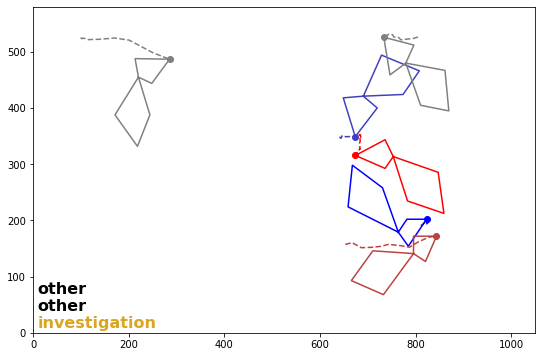

In [ ]:
#@title 🧪 Testing multi-trajectory animation
video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_seq_1 = training_data['annotator-id_0'][video_list[0]]
sample_seq_2 = training_data['annotator-id_0'][video_list[1]]
sample_seq_3 = training_data['annotator-id_0'][video_list[2]]

ANIMATION_START = 1000
ANIMATION_STOP = 1200
ANIMATION_STEP = 2
animation_range = range(ANIMATION_START,ANIMATION_STOP,ANIMATION_STEP)

# %matplotlib notebook
fig = plt.figure(figsize=[9,6])
plt.xlim(0,1050)
plt.ylim(0,580)
anim = plot_mice_multitrial(fig, [sample_seq_1, sample_seq_2, sample_seq_3], frame_range=animation_range)
anim

Now for something actually useful- let's use this plotter to study the effect of smoothing on our trajectory.

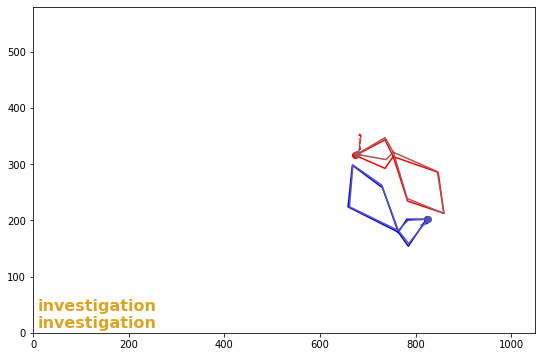

In [ ]:
#@title 🧪 Visualizing the effect of smoothing
SEQUENCE_NUM = 0
ANIMATION_START = 1000
ANIMATION_STOP = 1100
ANIMATION_STEP = 5
animation_range = range(ANIMATION_START,ANIMATION_STOP,ANIMATION_STEP)

video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_seq = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]

smoothed_seq = copy.deepcopy(sample_seq) # copy our original trial

#########################################
# try messing with parameters in this section to see the effect on pose estimates

med_filter_size = 15    # smooth keypoint positions by taking the median over a XX-frame window
gauss_filter_size = 10  # smooth keypoint positions by taking a gaussian-weighted moving average (for a gaussian with standard deviation sigma)

# un-comment (ctrl + /) one of these two lines, and comment the other, to apply either median-filtering or gaussian filtering to the trajectory.

smoothed_seq['keypoints'] = median_filter(smoothed_seq['keypoints'], size=(med_filter_size,1,1,1))
# smoothed_seq['keypoints'] = gaussian_filter(smoothed_seq['keypoints'], sigma=(gauss_filter_size,0,0,0))

#########################################

# %matplotlib notebook
fig = plt.figure(figsize=[9,6])
plt.xlim(0,1050)
plt.ylim(0,580)
anim = plot_mice_multitrial(fig, [sample_seq, smoothed_seq], frame_range=animation_range)
anim

## ❖ Converting poses to egocentric coordinates
It can be tricky to follow what's happening in a social interaction. One strategy is to plot pose trajectories in egocentric coordinates- that is, to center everything on the resident (red) mouse. Let's try it and see what happens!

This conversion takes two steps: first, we center on one mouse, by subtracting the location of one of its body parts (we'll use the neck.)

> Note: we snuck in some additional functionality to plot the approximate bounds of the homecage- get rid of `arena=arena_stack` argument in the call to `plot_mice_multitrial` to see what it looks like without it.

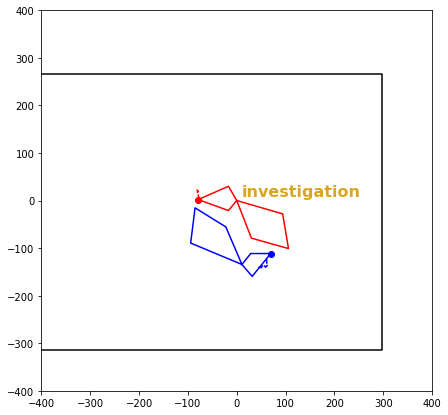

In [ ]:
#@title 🧪 Centering the animation on the resident mouse

SEQUENCE_NUM = 0
ANIMATION_START = 1000
ANIMATION_STOP = 1200
ANIMATION_STEP = 10
animation_range = range(ANIMATION_START,ANIMATION_STOP,ANIMATION_STEP)

video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_seq = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]
keypoints = np.array(sample_seq['keypoints'])

# plotting a line between these points creates a rectangle around the arena
arena_bounds = np.array([[0,0],[0,580],[1050,580],[1050,0],[0,0]])

# we need to compute the arena position post-mouse-centering for each frame:
arena_stack = np.zeros((len(sample_seq['keypoints']),5,2))
for fr in range(len(sample_seq['keypoints'])):
  arena_stack[fr,:,:] = (arena_bounds - keypoints[fr,0,:,3,np.newaxis].T)

centered_seq = copy.deepcopy(sample_seq)

# first, we subtract the location of mouse 0's neck (keypoint 3) from all keypoint locations, on each frame.
# if we index a specific entry of keypoints, we need to follow it with np.newaxis to make sure the overall dimensions
# are unchanged (otherwise we won't know how to subtract it from the original keypoints).
centered_seq['keypoints'] = np.array(centered_seq['keypoints']) - np.array(centered_seq['keypoints'])[:,0,np.newaxis,:,3,np.newaxis]

# let's see how we did (note I changed the axis limits to center on (0,0), where our red mouse's neck should be):
# %matplotlib notebook
fig = plt.figure(figsize=[7,7])
plt.xlim(-400,400)
plt.ylim(-400,400)
anim = plot_mice_multitrial(fig, [centered_seq], frame_range=animation_range, arena=arena_stack)
anim

Now that it's centered, we'll rotate the body so it's always facing the same direction. You'll need to define a pair of points to use in computing the facing direction of the mouse- you can try three options here to see how they differ.

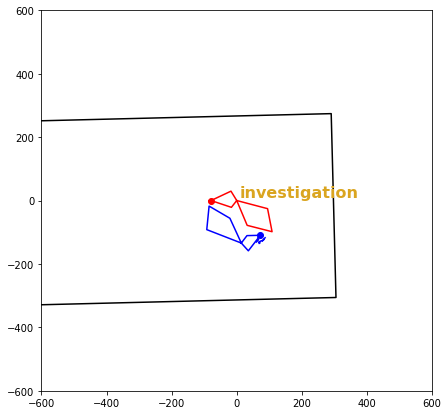

In [ ]:
#@title 🧪 Rotating resident mouse to a fixed orientation

SEQUENCE_NUM = 0
ANIMATION_START = 1000
ANIMATION_STOP = 1200
ANIMATION_STEP = 20
animation_range = range(ANIMATION_START,ANIMATION_STOP,ANIMATION_STEP)

video_list = list(training_data['annotator-id_0'].keys())  # get the list of all videos
sample_seq = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]
sample_seq['keypoints'] = np.array(sample_seq['keypoints'])

# this is the same centering code as before
centered_seq = copy.deepcopy(sample_seq)
centered_seq['keypoints'] = np.array(centered_seq['keypoints']) - np.array(centered_seq['keypoints'])[:,0,np.newaxis,:,3,np.newaxis]

# now, we need to rotate our field of view so that we fix the orientation of
# our mouse 0. what counts as "fixed"? the options below center using either
# the ears, the nose-neck line, or the neck-tailbase line.

d_ears = centered_seq['keypoints'][:,0,:,2] - centered_seq['keypoints'][:,0,:,1]
d_nose = centered_seq['keypoints'][:,0,:,3] - centered_seq['keypoints'][:,0,:,0]
d_body = centered_seq['keypoints'][:,0,:,6] - centered_seq['keypoints'][:,0,:,3]

########################################

USE_PART = d_nose # set this to d_body/d_nose/d_ears to see how the results change!

########################################

theta = np.arctan2(USE_PART[:,1],USE_PART[:,0])                                 # compute the angle formed by these parts
R = np.array([[np.cos(theta), -np.sin(theta)],[np.sin(theta), np.cos(theta)]])  # construct a rotation matrix that inverts that angle
R = np.transpose(R,(2,0,1))

arena_bounds = np.array([[0,0],[0,580],[1050,580],[1050,0],[0,0]])

arena_stack = np.zeros((len(centered_seq['keypoints']),5,2))
for fr in range(len(centered_seq['keypoints'])):
  for mouse in [0,1]:
      centered_seq['keypoints'][fr,mouse,:,:] = (centered_seq['keypoints'][fr,mouse,:,:].T @ R[fr,:,:]).T
  arena_stack[fr,:,:] = (arena_bounds - sample_seq['keypoints'][fr,0,:,3,np.newaxis].T) @ R[fr,:,:]  # shift then rotate our arena the same way we shifted + rotated our mice

# let's see how we did:
# %matplotlib notebook
fig = plt.figure(figsize=[7,7])
plt.xlim(-600,600)
plt.ylim(-600,600)
anim = plot_mice_multitrial(fig, [centered_seq], frame_range=animation_range, arena=arena_stack)
anim

### ❓ Egocentric vs allocentric coordinates

> Conversion to egocentric coordinates gets rid of signals like the animal's location in the arena, which is not a "meaningful" source of variance for an unsupervised analysis.
>
> **However**, it could be that location in the arena is helpful for detecting certain user-defined behaviors- a lot of mounting and attack happens in the corners.
>
> Also, notice how hard it is to gauge how fast the intruder mouse is walking when we view things in the resident's frame of view (unless the resident is holding still.)

# Part III. From pose to features

We've looked at some mice, and some behaviors. Now, how can we extract some useful information from all that pose data?

## ❖ Extracting pose features using functional programming

We can use the poses of our tracked mice to compute some features of interest, either frame-by-frame or at the level of sequences.

If you're computing lots of features (for example, to make a classifier), it can be helpful to define them **functionally**. Anonymous functions, or [*lambdas*](https://www.w3schools.com/python/python_lambda.asp), are a convenient way to definine many small operations that you can then apply to any dataset you want.

To see how they work, we'll create a pair of lambdas that 1) compute a "median" of a mouse's body, and 2) computes the distances between those medians.

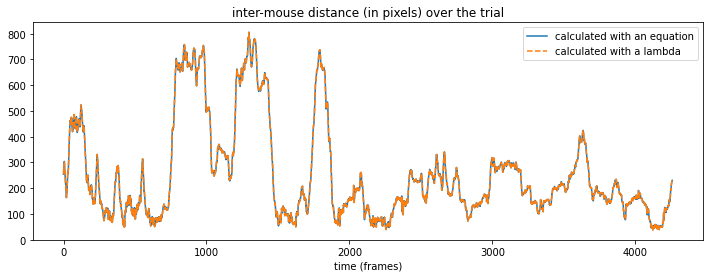

In [ ]:
#@title 🔎 Two ways to compute the distance between animals

SEQUENCE_NUM = 10

# unpack the data from this trial.
video_list = list(training_data['annotator-id_0'].keys())
sample_video = training_data['annotator-id_0'][video_list[SEQUENCE_NUM]]
keypoints = np.array(sample_video['keypoints'])

# compute the distance between the medians of the two mice on this trial.
med_distance = np.linalg.norm(np.median(keypoints[:,0,:,:], axis=2) - np.median(keypoints[:,1,:,:], axis=2), axis=1)

# create some "lambdas" (anonymous functions) that do the same thing, in two steps:
lam = {}
# first, a lambda to find the median of a mouse
lam['mouse_median'] = lambda x: np.median(x[:,:,:], axis=2)

# now we find the distance between two mice, by first calling fun(mouse1) and fun(mouse2),
# then taking the euclidean distance between them with np.linalg.norm. When we call this
# lambda, we'll tell it which function to use for 'fun', which will determine how the
# location of the animal is calculated.
lam['med_distance'] = lambda x, fun: np.linalg.norm(fun(x[:,0,:,:]) - fun(x[:,1,:,:]), axis=1)

%matplotlib inline
plt.figure(figsize=(12,4))

plt.plot(med_distance, label='calculated with an equation')
plt.plot(lam['med_distance'](keypoints, lam['mouse_median']),'--',label='calculated with a lambda')

plt.title('inter-mouse distance (in pixels) over the trial');
plt.legend();
plt.xlabel('time (frames)');

We can play around with the design of our pose features to try to find interesting aspects of animal behavior.

In [ ]:
#@title 🧪 Create some inter- and intra-mouse distance features

lam = {'part':{},'filt':{}}
# some trivial functions to get the coordinates of body parts. Note that we still
# rely on our knowledge of which indices are which bodypart here- it would be better
# if we had a way to get this without hard-coding, so that if we changed the format
# of our pose, our features wouldn't break.
lam['part']['nose']       = lambda x,m: x[:,m,:,0] # we expect dimensions of (frames x (x,y) x part), ie no mouse identity dimension here
lam['part']['ear1']       = lambda x,m: x[:,m,:,1]
lam['part']['ear2']       = lambda x,m: x[:,m,:,2]
lam['part']['neck']       = lambda x,m: x[:,m,:,3]
lam['part']['hip1']       = lambda x,m: x[:,m,:,4]
lam['part']['hip2']       = lambda x,m: x[:,m,:,5]
lam['part']['tail']       = lambda x,m: x[:,m,:,6]

# some derived coordinates of body parts.
lam['part']['centroid']   = lambda x,m: np.median(x[:,m,:,:], axis=2)   # finds the median of all keypoints
lam['part']['head']       = lambda x,m: np.mean(x[:,m,:,:4], axis=2)    # finds the mean of the head keypoints
lam['part']['body']       = lambda x,m: np.mean(x[:,m,:,3:], axis=2)    # finds the mean of the body keypoints

# smoothing filters
lam['filt']['med']        = lambda x, filter_size: median_filter(x, size=(filter_size)) # median-filters a time series
lam['filt']['gaus']       = lambda x, filter_size: gaussian_filter(x, sigma=(filter_size)) # gaussian-filters a time series
lam['filt']['min']        = lambda x, filter_size: minimum_filter(x, size=(filter_size)) # minimum-filters a time series
lam['filt']['max']        = lambda x, filter_size: maximum_filter(x, size=(filter_size)) # max-filters a time series

# finds the (euclidean) distance between two things that have dimensions (frame x (x,y))
lam['euc_distance']       = lambda x1, x2: np.linalg.norm(x1 - x2, axis = 1)

# finds the distance between points, either from a pair of mice or from within a mouse
# note that we specify which mouse gets passed to each function
lam['part_distance']      = lambda x, mice, f1, f2: lam['euc_distance'](f1(x,mice[0]), f2(x,mice[1]))

# find the ratio between nose-tail and hip-hip distances, to quantify elongation in a way
# that normalizes for mouse size.
lam['stretch_ratio']      = lambda x, mouse: lam['part_distance'](x, mice=[mouse,mouse], f1=lam['part']['nose'], f2=lam['part']['tail']) / \
                          lam['filt']['med'](lam['part_distance'](x, mice=[mouse,mouse], f1=lam['part']['hip1'], f2=lam['part']['hip2']), 10)

lam['normalize']          = lambda x: (x - min(x))/(max(x)-min(x))

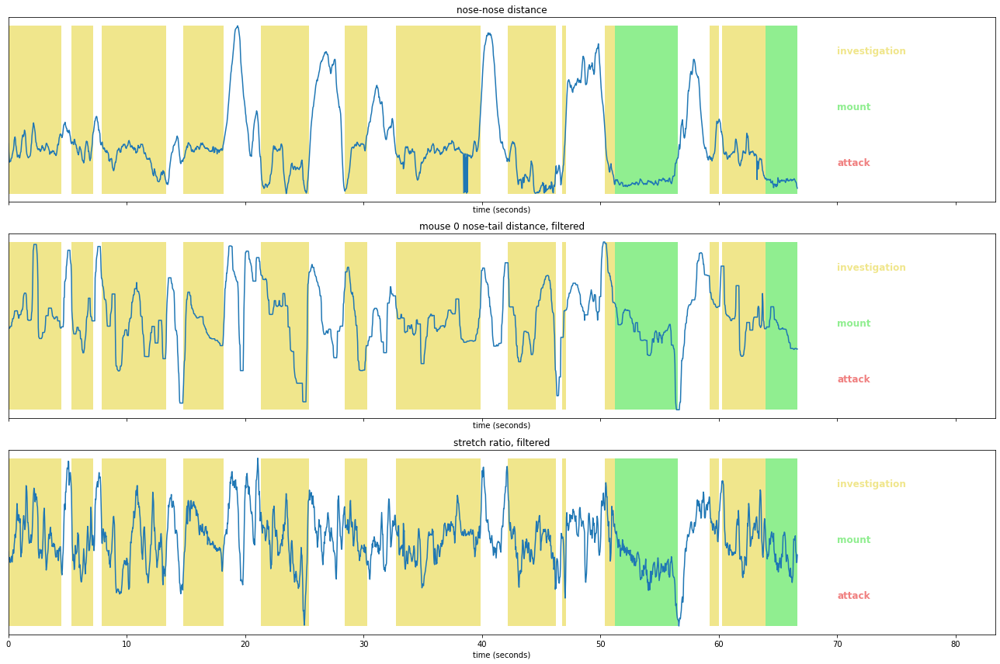

In [ ]:
#@title 🧪 Plotting distance features

SEQUENCE_NUM = 0
START_FRAME = 500
STOP_FRAME  = 2500

video_list = list(training_data['annotator-id_0'].keys())
sample_seq = copy.deepcopy(training_data['annotator-id_0'][video_list[SEQUENCE_NUM]])
sample_seq['keypoints'] = np.array(sample_seq['keypoints'])[START_FRAME:STOP_FRAME,:,:,:]
sample_seq['annotations'] = np.array(sample_seq['annotations'])[START_FRAME:STOP_FRAME]
keypoints = np.array(sample_seq['keypoints'])

#####################################################
# plotting code:

%matplotlib inline
fig,ax = plt.subplots(3,1,figsize=(18,12), sharex=True)

fps = 30.
time = np.arange(len(keypoints))/fps # convert frames to seconds
colors={'attack':'lightcoral','mount':'lightgreen','investigation':'khaki','other':'white'} # lighter colors for readability
bouts = convert_to_bouts(sample_seq['annotations'], sample_seq['metadata']['vocab']) # get behavior bouts
tmax = len(sample_seq['annotations'])

for i in range(3):
  raster_plotter(bouts, vocab, tmax, ax[i], fps=fps, stagger=False, colors=colors)

# try defining your own features in terms of the lambdas we've pre-defined. Here
# are example features that compute distance between mouse noses, the nose-tail
# distance of the resident mouse, and the length-to-width ratio of the resident mouse.

my_feature = lam['part_distance'](keypoints, mice=[0, 1], f1=lam['part']['nose'], f2=lam['part']['nose'])
my_feature_name = 'nose-nose distance'
ax[0].plot(time, lam['normalize'](my_feature),label=my_feature_name)
ax[0].set_title(my_feature_name)

my_feature = lam['filt']['med'](lam['part_distance'](keypoints, mice=[0, 0], f1=lam['part']['nose'], f2=lam['part']['tail']),15)
my_feature_name = 'mouse 0 nose-tail distance, filtered'
ax[1].plot(time, lam['normalize'](my_feature),label=my_feature_name)
ax[1].set_title(my_feature_name)

my_feature = lam['stretch_ratio'](keypoints, mouse=0)
# my_feature = lam['filt']['med'](my_feature, 15)
my_feature_name = 'stretch ratio, filtered'
ax[2].plot(time, lam['normalize'](my_feature),label=my_feature_name)
ax[2].set_title(my_feature_name)

fig.tight_layout()

### ❓ When and how to filter your data

> We saw before that a Gaussian filter caused the poses of the mice to distort, making it a bad choice for smoothing trajectories. When your observation noise is mostly large jumps (like popping in a pose), a median filter can do a better job of preserving fast signals while removing outliers.
>
> Similarly, we used a median filter for the stretch ratio above: without it we get occasional massive values because MARS places both hip keypoints on the same side of the mouse, causing a tiny inter-hip distance in the denominator of the ratio.
>
> When we calculate joint angles below, an assumption of Gaussian noise could be more reasonable, so we use a Gaussian filter. A median filter would probably work just as well though.

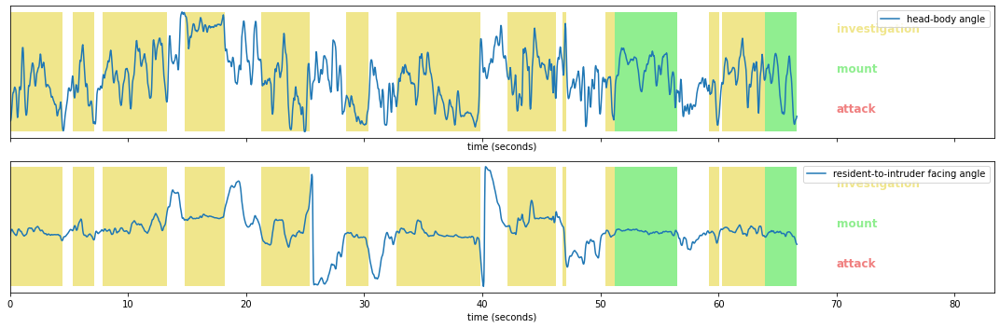

In [ ]:
#@title 🧪 Create and plot joint-angle features

# this formulation gives us the interior angle between two vectors v0 and v1 formed from a triplet of points
def interior_angle(p0, p1, p2):
    v0 = np.array(p0) - np.array(p1)
    v1 = np.array(p2) - np.array(p1)
    ang = [math.atan2(np.linalg.det([v00, v10]), np.dot(v00, v10)) for v00,v10 in zip(v0,v1)]
    return ang

lam['angle']={}
lam['angle']['nose_neck_tail']  = lambda x, m: np.sin(interior_angle(lam['part']['nose'](x,m), lam['part']['neck'](x,m), lam['part']['tail'](x,m)))
lam['angle']['facing']          = lambda x, m: interior_angle(lam['part']['nose'](x,m), lam['part']['body'](x,m), lam['part']['body'](x,int(not m)))
# when your mice are numbered 0,1, `int(not m)` translates to "the other mouse" (it's 1 if m==0, and 0 if m==1)

#####################################################
# plotting code:

SEQUENCE_NUM = 0
START_FRAME = 500
STOP_FRAME  = 2500

video_list = list(training_data['annotator-id_0'].keys())
sample_seq = copy.deepcopy(training_data['annotator-id_0'][video_list[SEQUENCE_NUM]])
sample_seq['keypoints'] = np.array(sample_seq['keypoints'])[START_FRAME:STOP_FRAME,:,:,:]
sample_seq['annotations'] = np.array(sample_seq['annotations'])[START_FRAME:STOP_FRAME]
keypoints = np.array(sample_seq['keypoints'])


%matplotlib inline
fig,ax = plt.subplots(2,1,figsize=(15,5), sharex=True)

fps = 30.
time = np.arange(len(keypoints))/fps # convert frames to seconds
colors={'attack':'lightcoral','mount':'lightgreen','investigation':'khaki','other':'white'} # lighter colors for readability
bouts = convert_to_bouts(sample_seq['annotations'], sample_seq['metadata']['vocab']) # get behavior bouts
tmax = len(sample_seq['annotations'])

for i in range(2):
  raster_plotter(bouts, vocab, tmax, ax[i], fps=fps, stagger=False, colors=colors)

my_feature = lam['angle']['nose_neck_tail'](keypoints, m=0)
my_feature_name = 'head-body angle'
ax[0].plot(time, lam['normalize'](lam['filt']['gaus'](my_feature,1)),label=my_feature_name)

my_feature = lam['angle']['facing'](keypoints, m=0)
my_feature_name = 'resident-to-intruder facing angle'
ax[1].plot(time, lam['normalize'](lam['filt']['gaus'](my_feature,1)),label=my_feature_name)

for i in ax:
  i.legend();

fig.tight_layout()

### ❓ Estimating angular features

> The best way to estimate the angle of a vector with dimensions `(x,y)` is to compute [`arctan2(y,x)`](https://en.wikipedia.org/wiki/Atan2): other methods are only suitable for angles between +/- 90 degrees, and run the risk of getting the quadrant of the angle wrong ([more reading here](https://geo.libretexts.org/Courses/University_of_California_Davis/GEL_056%3A_Introduction_to_Geophysics/Geophysics_is_everywhere_in_geology.../zz%3A_Back_Matter/Arctan_vs_Arctan2)).
>
> `arctan2` can still produce weird results, though, when the angle you're estimating is very close to 180 degrees- it will pop between +/-180 given only small movements of the animal.
>
> To correct for this issue, we take advantage of the fact that `sin(x)~x` when `x` is close to 0 or 180. Therefore we aren't really computing the nose-neck-tail angle in the feature above: we're computing its `sin`.
>
> Nose-neck-tail angles are unlikely to be near 0 (unless your mouse is a contortionist), however if you're working with other angular features and suspect "popping" might be a problem, it's always a good bet to convert your feature `x` to `sin(x)` and `cos(x)`.

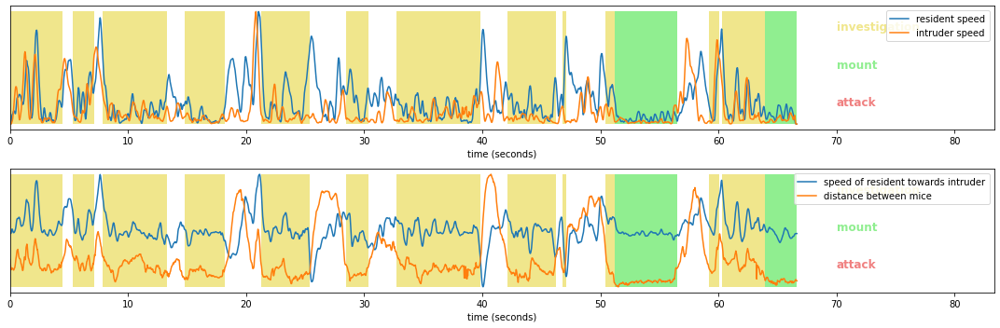

In [ ]:
#@title 🧪 Create and plot velocity features

lam['velocity']         = lambda x, m: np.pad(lam['part']['centroid'](x,m)[10:] - lam['part']['centroid'](x,m)[:-10],((5,5),(0,0)))
lam['speed']            = lambda x, m: np.pad(lam['euc_distance'](lam['part']['centroid'](x,m)[10:], lam['part']['centroid'](x,m)[:-10]),((5,5)))
lam['centroid_vector']  = lambda x, m: (lam['part']['centroid'](x,m) - lam['part']['centroid'](x,int(not m))) / \
                                        lam['euc_distance'](lam['part']['centroid'](x,m), lam['part']['centroid'](x,int(not m)))[:,np.newaxis]
lam['speed_to_mouse']   = lambda x, m: -np.sum(lam['velocity'](x,m) * lam['centroid_vector'](x,m), axis=1)


#####################################################
# plotting code:

SEQUENCE_NUM = 0
START_FRAME = 500
STOP_FRAME  = 2500

video_list = list(training_data['annotator-id_0'].keys())
sample_seq = copy.deepcopy(training_data['annotator-id_0'][video_list[SEQUENCE_NUM]])
sample_seq['keypoints'] = np.array(sample_seq['keypoints'])[START_FRAME:STOP_FRAME,:,:,:]
sample_seq['annotations'] = np.array(sample_seq['annotations'])[START_FRAME:STOP_FRAME]
keypoints = np.array(sample_seq['keypoints'])

%matplotlib inline
fig,ax = plt.subplots(2,1,figsize=(15,5))

fps = 30.
time = np.arange(len(keypoints))/fps # convert frames to seconds
colors={'attack':'lightcoral','mount':'lightgreen','investigation':'khaki','other':'white'} # lighter colors for readability
bouts = convert_to_bouts(sample_seq['annotations'], sample_seq['metadata']['vocab']) # get behavior bouts
tmax = len(sample_seq['annotations'])

for i in range(2):
  raster_plotter(bouts, vocab, tmax, ax[i], fps=fps, stagger=False, colors=colors)

use_filter = 'gaus'
win = 1
my_feature = lam['speed'](keypoints, m=0)
my_feature_name = 'resident speed'
ax[0].plot(time, lam['normalize'](lam['filt'][use_filter](my_feature,win)),label=my_feature_name)

my_feature = lam['speed'](keypoints, m=1)
my_feature_name = 'intruder speed'
ax[0].plot(time, lam['normalize'](lam['filt'][use_filter](my_feature,win)),label=my_feature_name)

my_feature = lam['speed_to_mouse'](keypoints, m=0)
my_feature_name = 'speed of resident towards intruder'
ax[1].plot(time, lam['normalize'](lam['filt'][use_filter](my_feature,win)),label=my_feature_name)

my_feature = lam['part_distance'](keypoints, mice=[0,1], f1=lam['part']['centroid'], f2=lam['part']['centroid'])
my_feature_name = 'distance between mice'
ax[1].plot(time, lam['normalize'](my_feature),label=my_feature_name)

for i in ax:
  i.legend();

fig.tight_layout()

### ❓ Estimating velocity

> We used a 10-frame window to estimate the animal's velocity (`lam['part']['centroid'](x,m)[10:] - lam['part']['centroid'](x,m)[:-10]`): this is because the change in keypoint location on neighboring video frames is often small, and dominated by noise.
>
> The downside of this strategy is that it discards some very high-frequency movement, but also it can classifiers using this feature sensitive to changes in video framerate. Still, it's at least easy to calculate!

### ❓ Interpreting pose features

> Plotting multiple features on the same axis for visual comparison can be helpful (so long as they're normalized, as we've done here.)
>
> What relationships do you see between the plotted features and the behavior annotations above? Which features might you use to try to detect bouts of investigation, or mounting?